<h1 align="center">Hacettepe University <br> Department of Computer Science </h1> 

<h2 align="center">BBM 415 - Fundamentals of Image Processing Laboratory<br>2022 Fall</h2>

<h3 align="center">Assignment 1</h3>
<h3 align="left">Name    :    Murat Çelik</h3>
<h3 align="left">ID      :    21827263</h3>
<h4 align="right">Due on November 3, 2022</h4>

# Problem Definition

* This problem is defined as coloring and improving the quality of the data using simple image processing techniques. 
     
* Sergei Mikhailovich Prokudin-Gorskii (1863-1944) [1], a Russian chemist took color photographs of people, daily life, buildings, landscapes documenting Russia in the early 20th century. In this respect, he is considered the pioneer of color photography. The photographs he took with blue, green and red filters were recently digitized and published. These published data are used as our main data in this project.

## Libraries

In [1]:
import numpy as np # Library that allows us to perform simple and fast matrix operations
from matplotlib import pyplot as plt # Library required for displaying the image
import cv2 # Functions such as reading pictures, defining the style of the picture are used with this library.
import time
import math
import os

## DataSet

Sample photos taken with 3 different filters are given below. Filter colors used from top to bottom: blue, green, red

In [2]:
img_1 = cv2.imread("data/00889v.jpg", cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread("data/00106v.jpg", cv2.IMREAD_GRAYSCALE)
img_3 = cv2.imread("data/01167v.jpg", cv2.IMREAD_GRAYSCALE)
img_4 = cv2.imread("data/00153v.jpg", cv2.IMREAD_GRAYSCALE)
img_5 = cv2.imread("data/00163v.jpg", cv2.IMREAD_GRAYSCALE)
img_6 = cv2.imread("data/01522v.jpg", cv2.IMREAD_GRAYSCALE)
img_7 = cv2.imread("data/01728v.jpg", cv2.IMREAD_GRAYSCALE)
img_8 = cv2.imread("data/31421v.jpg", cv2.IMREAD_GRAYSCALE)

In [3]:
print(f"Size of a sample image {img_1.shape}")

Size of a sample image (1024, 398)


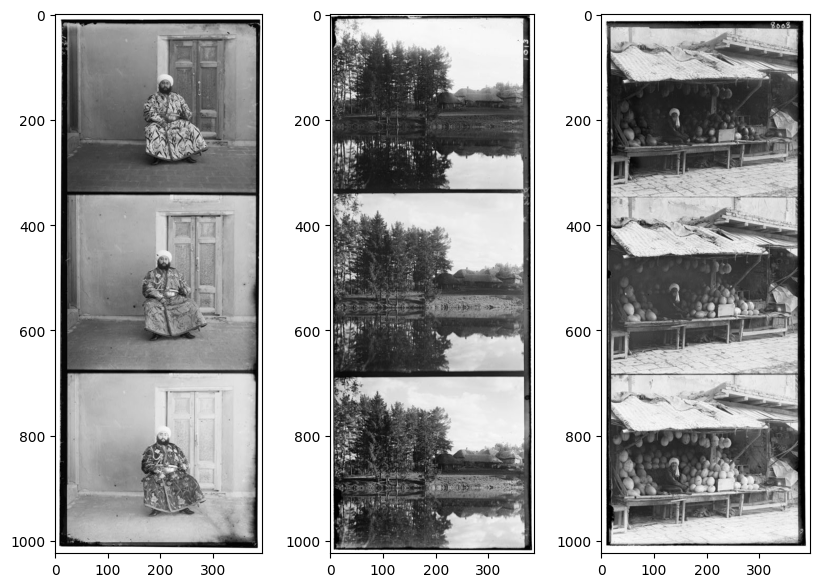

In [4]:
f, axarr = plt.subplots(1,3, figsize=(10,7))
axarr[0].imshow(img_4,cmap="gray")
axarr[1].imshow(img_5,cmap="gray")
axarr[2].imshow(img_7,cmap="gray")

## Methodology

### Step 1
A sample image is selected. There are 3 filtered images in an image. We divide this picture into 3 equal parts vertically and define it as a blue, green and red filter, respectively.

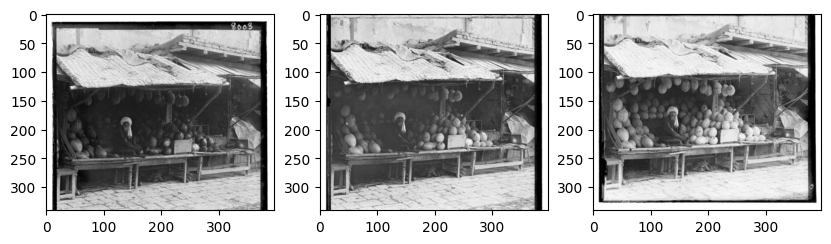

In [5]:
img = img_7
height = int(len(img)/3) # three equal parts

B = img[:height]
G = img[height:2*height]
R = img[2*height:3*height]

f, axarr = plt.subplots(1,3, figsize=(10,7))
axarr[0].imshow(B,cmap="gray")
axarr[1].imshow(G,cmap="gray")
axarr[2].imshow(R,cmap="gray")

### Step 2
Combine 3 different filters and you get a colorful picture.

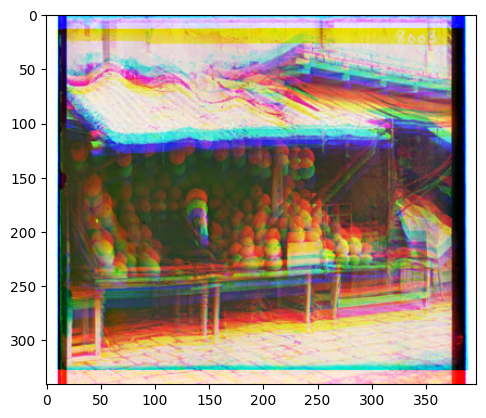

In [6]:
stacked = np.dstack([R, G, B])
plt.imshow(stacked)

### Step 3
Use matching metrics for pixel location errors between filters.

In [7]:
range_pxl = 30

#### Step 3.1 Sum of squared differences (SSD)

A score is obtained when two different images are subtracted from each other, squared, and summed between dimensions. By minimizing this score, the error is corrected and a clearer picture emerges.

In [8]:
def SSD(A, B):
    return np.sum(np.sum((A-B)**2))

In [9]:
def SSD_alignment(A, B, range_pixel):
    min_ssd = np.Inf
    ivalue=np.linspace(-range_pixel,range_pixel,2*range_pixel,dtype=int)
    jvalue=np.linspace(-range_pixel,range_pixel,2*range_pixel,dtype=int)
    output = [0,0]
    for i in ivalue:
        for j in jvalue:
            ssd_score = SSD(A,np.roll(B,[i,j],axis=(0,1)))
            if ssd_score < min_ssd:
                min_ssd = ssd_score
                output = [i,j]
    return output

* The blue filter is kept constant. The green filter is aligned first. The red filter is then aligned relative to the blue.İ
* The function returns the number of pixels that need to be shifted optimally for alignment based on the SSD score.
* The third parameter value is the value that specifies how many pixels should be searched in the match search. An appropriate number should be chosen.

In [10]:
first_ssd = time.time()
match_G_to_B_SSD = SSD_alignment(B,G,range_pxl)
second_ssd = time.time()
match_R_to_B_SSD = SSD_alignment(B,R,range_pxl)

In [11]:
new_G_SSD =np.roll(G,match_G_to_B_SSD,axis=(0,1)) # Slide the green filter.
new_R_SSD =np.roll(R,match_R_to_B_SSD,axis=(0,1)) # Slide the red filter.

In [12]:
coloured_with_SSD = np.dstack((new_R_SSD,new_G_SSD,B)).astype(np.uint8)

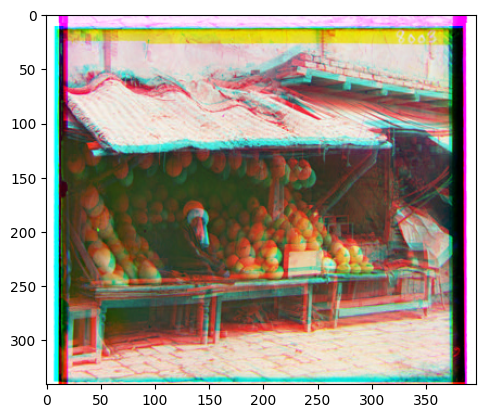

In [13]:
plt.imshow(coloured_with_SSD)

In [14]:
time_ssd = second_ssd - first_ssd
print(f"[-{range_pxl},{range_pxl}] match search time in range for SSD : {time_ssd}")

[-30,30] match search time in range for SSD : 1.4071176052093506


#### Step 3.2 Normalized cross-correlation (NCC)

By defining metrics such as the means and standard deviations of the intensities in the image, the normalized cross-correlation score is obtained. By maximizing this score, better quality images are produced.

In [15]:
def NCC(A, B):
    up = np.sum((A - np.mean(A))*(B - np.mean(B)))
    down = np.sum(np.sqrt((np.sum(A - np.mean(A))**2)*(np.sum(B - np.mean(B))**2)))
    return up / (down + 1)

In [16]:
def NCC_alignment(a, b, range_pixel):
    max_ncc = -1
    ivalue=np.linspace(-range_pixel,range_pixel,2*range_pixel,dtype=int)
    jvalue=np.linspace(-range_pixel,range_pixel,2*range_pixel,dtype=int)
    output = [0,0]
    for i in ivalue:
        for j in jvalue:
            ncc_Score = NCC(a,np.roll(b,[i,j],axis=(0,1)))
            if ncc_Score > max_ncc:
                max_ncc = ncc_Score
                output = [i,j]
    return output

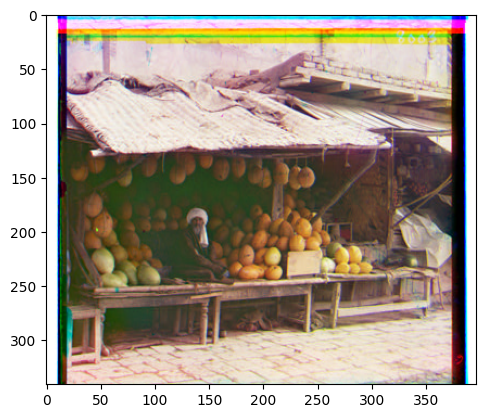

In [17]:
first_ncc = time.time()
match_G_to_B_NCC = NCC_alignment(B,G,range_pxl)
second_ncc = time.time()
match_R_to_B_NCC = NCC_alignment(B,R,range_pxl)

new_G_NCC =np.roll(G,match_G_to_B_NCC,axis=(0,1)) # Slide the green filter.
new_R_NCC =np.roll(R,match_R_to_B_NCC,axis=(0,1)) # Slide the red filter.

coloured_with_NCC = np.dstack((new_R_NCC,new_G_NCC,B)).astype(np.uint8)

plt.imshow(coloured_with_NCC)

In [18]:
time_ncc = second_ncc - first_ncc
print(f"[-{range_pxl},{range_pxl}] match search time in range for NCC : {time_ncc}")

[-30,30] match search time in range for NCC : 14.810631275177002


#### Step 3.3 NCC vs SSD

* NCC's success in the common range is much greater. Despite this, SSD's running time is extremely fast compared to NCC.

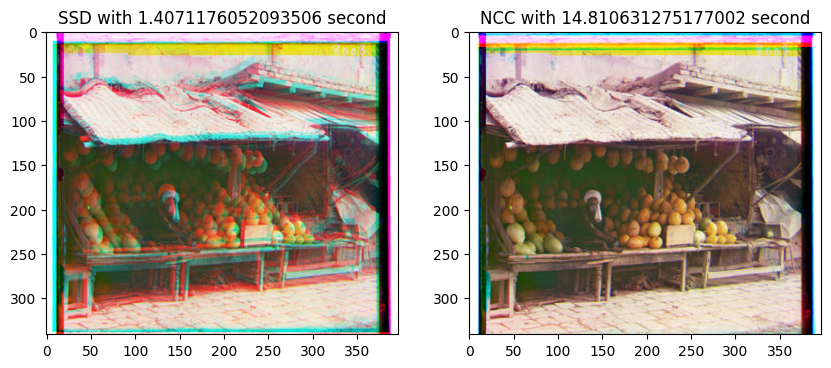

In [19]:
f, axarr = plt.subplots(1,2, figsize=(10,7))
axarr[0].imshow(coloured_with_SSD,cmap="gray")
axarr[0].title.set_text(f"SSD with {time_ssd} second")
axarr[1].imshow(coloured_with_NCC,cmap="gray")
axarr[1].title.set_text(f"NCC with {time_ncc} second")

### Step 4 
* Search for matches with different range values. Find the best result for a picture.

In [20]:
def filter_match(img, range_pxl):
    height = int(len(img)/3) # three equal parts

    B = img[:height]
    G = img[height:2*height]
    R = img[2*height:3*height]
    
    stacked = np.dstack([R, G, B])
    match_G_to_B_NCC = NCC_alignment(B,G,range_pxl)
    match_R_to_B_NCC = NCC_alignment(B,R,range_pxl)
    
    new_G_NCC =np.roll(G,match_G_to_B_NCC,axis=(0,1)) # Slide the green filter.
    new_R_NCC =np.roll(R,match_R_to_B_NCC,axis=(0,1)) # Slide the red filter.

    coloured_with_NCC = np.dstack((new_R_NCC,new_G_NCC,B)).astype(np.uint8)
    return coloured_with_NCC

In [21]:
img_list = [img_1, img_2, img_3, img_4, img_5, img_6, img_7, img_8]
pix_range_list = [5,10,15,20,25,30]

In [22]:
path = "NCC"
isExist = os.path.exists(path)
if not isExist:
    os.makedirs(path)
    print("The new directory is created!")

The new directory is created!


In [23]:
for pix in pix_range_list:
    for i in range(len(img_list)):
        next_image = img_list[i]
        coloured = filter_match(next_image, pix)
        coloured=coloured[int(coloured.shape[0]*0.05):int(coloured.shape[0]-coloured.shape[0]*0.05),
                          int(coloured.shape[1]*0.05):int(coloured.shape[1]-coloured.shape[1]*0.05)]
        cv2.imwrite("NCC/" + str(pix) + "_" + str(i) + ".jpg", coloured)

In [24]:
def plot_images(number):
    number -= 1
    img_1 = cv2.imread("NCC/" + str(5) + "_" + str(number) + ".jpg")
    img_2 = cv2.imread("NCC/" + str(10) + "_" + str(number) + ".jpg")
    img_3 = cv2.imread("NCC/" + str(15) + "_" + str(number) + ".jpg")
    img_4 = cv2.imread("NCC/" + str(20) + "_" + str(number) + ".jpg")
    img_5 = cv2.imread("NCC/" + str(25) + "_" + str(number) + ".jpg")
    img_6 = cv2.imread("NCC/" + str(30) + "_" + str(number) + ".jpg")
    
    f, axarr = plt.subplots(2,3, figsize=(10,7))
    axarr[0,0].imshow(img_1)
    axarr[0,1].imshow(img_2)
    axarr[0,2].imshow(img_3)
    axarr[1,0].imshow(img_4)
    axarr[1,1].imshow(img_5)
    axarr[1,2].imshow(img_6)
    axarr[0,0].title.set_text("Range : 5")
    axarr[0,1].title.set_text("Range : 10")
    axarr[0,2].title.set_text("Range : 15")
    axarr[1,0].title.set_text("Range : 20")
    axarr[1,1].title.set_text("Range : 25")
    axarr[1,2].title.set_text("Range : 30")

### Step 5
* Choose a photo and turn it into a higher quality picture with some techniques. State your inferences.

* In some techniques, processing is done by converting the RGB model to HSV color space. This varies according to the type of technique.

In [25]:
def gamma_correction(img, mid):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hue, sat, val = cv2.split(hsv)

    # compute gamma = log(mid*255)/log(mean)
    mean = np.mean(val)
    gamma = math.log(int(mid*255))/math.log(mean)

    # do gamma correction on value channel
    val_gamma = np.power(val, gamma).clip(0,255).astype(np.uint8)

    # combine new value channel with original hue and sat channels
    hsv_gamma = cv2.merge([hue, sat, val_gamma])
    img_gamma = cv2.cvtColor(hsv_gamma, cv2.COLOR_HSV2BGR)
    return img_gamma


In [26]:
def equalize_hist(img):
    src = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return cv2.equalizeHist(src)

In [27]:
def contrast(img):
    lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a, b = cv2.split(lab)

    # Applying CLAHE to L-channel
    # feel free to try different values for the limit and grid size:
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l_channel)

    # merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv2.merge((cl,a,b))

    # Converting image from LAB Color model to BGR color spcae
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

    return enhanced_img

#### Example 1
* The 6th picture is selected. (Range: 30)

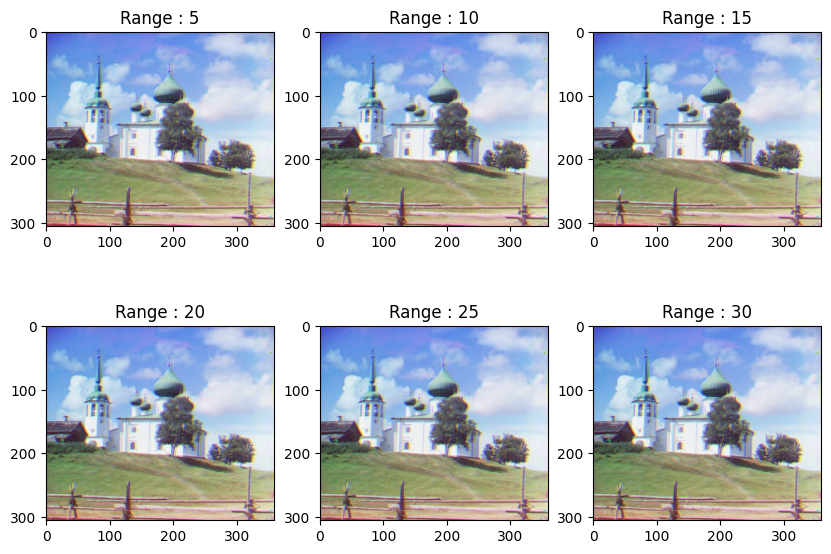

In [28]:
plot_images(1)

* This example is not considered a failure. The quality of the sample can be increased by using neural network techniques for clarification.

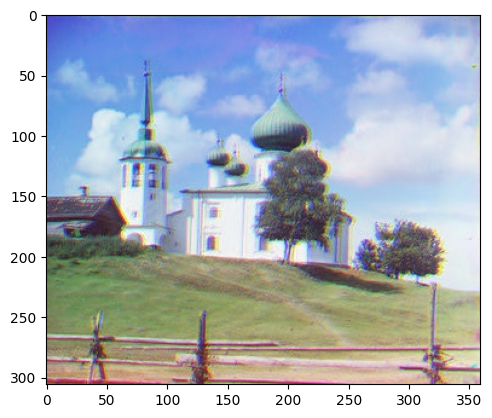

In [29]:
img_1 = cv2.imread("NCC/" + str(30) + "_" + str(0) + ".jpg")
plt.imshow(img_1)

#### 1.1 After Contrast

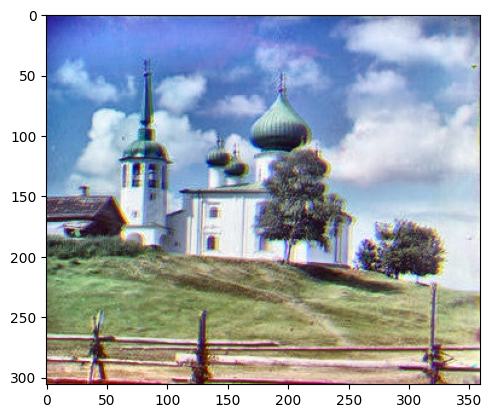

In [30]:
new_img_1 = contrast(img_1)
plt.imshow(new_img_1)

#### 1.2 After Gamma Correction

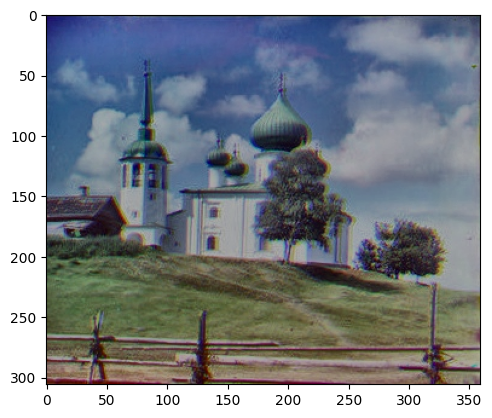

In [31]:
new_img_1 = gamma_correction(new_img_1, 0.5)
plt.imshow(cv2.cvtColor(new_img_1, cv2.COLOR_RGB2BGR))

#### Example 2
* The 6th picture is selected. (Range: 30)

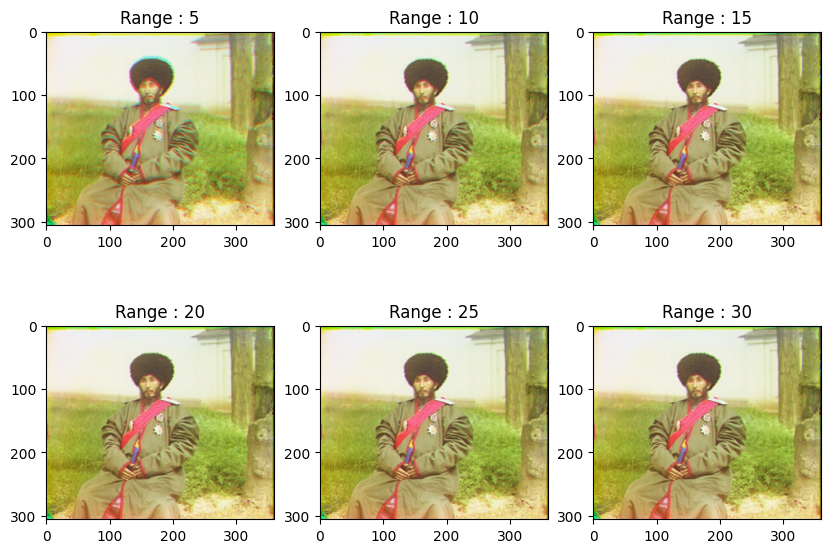

In [32]:
plot_images(2)

* A successful example is given below. This success was corrected by minor adjustment to the proximity of the filters to each other.

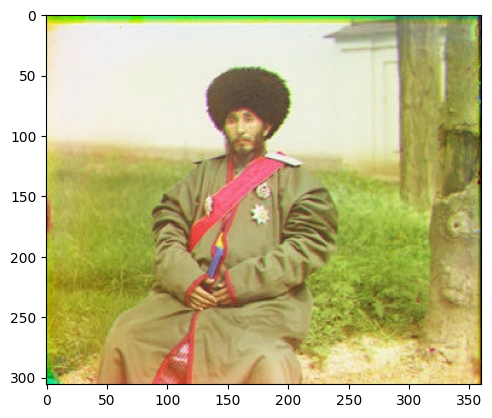

In [33]:
img_2 = cv2.imread("NCC/" + str(30) + "_" + str(1) + ".jpg")
plt.imshow(img_2)

* Sample with successful match has been improved with attention to contrast sensitivity.

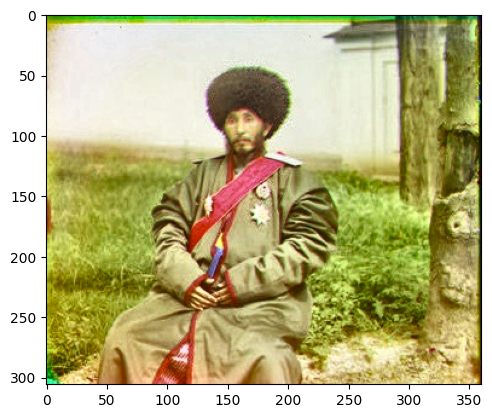

In [34]:
new_img_2 = contrast(img_2)
plt.imshow(new_img_2)

#### Example 3
* The 6th picture is selected. (Range: 30)

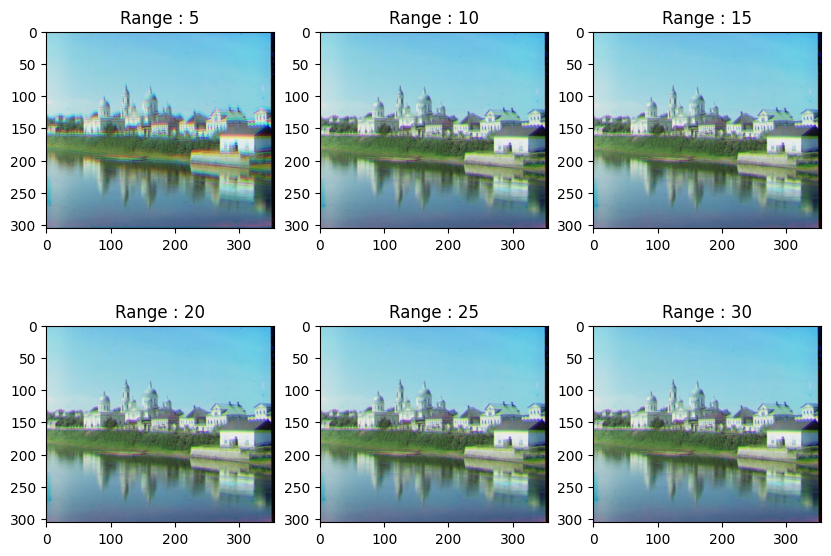

In [35]:
plot_images(3)

* A successful example has been observed.

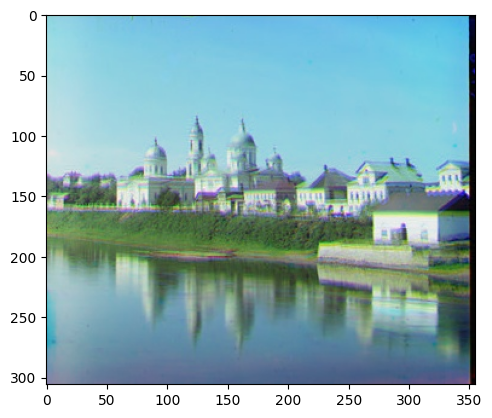

In [36]:
img_3 = cv2.imread("NCC/" + str(30) + "_" + str(2) + ".jpg")
plt.imshow(img_3)

#### Example 4
* The 6th picture is selected. (Range: 30)


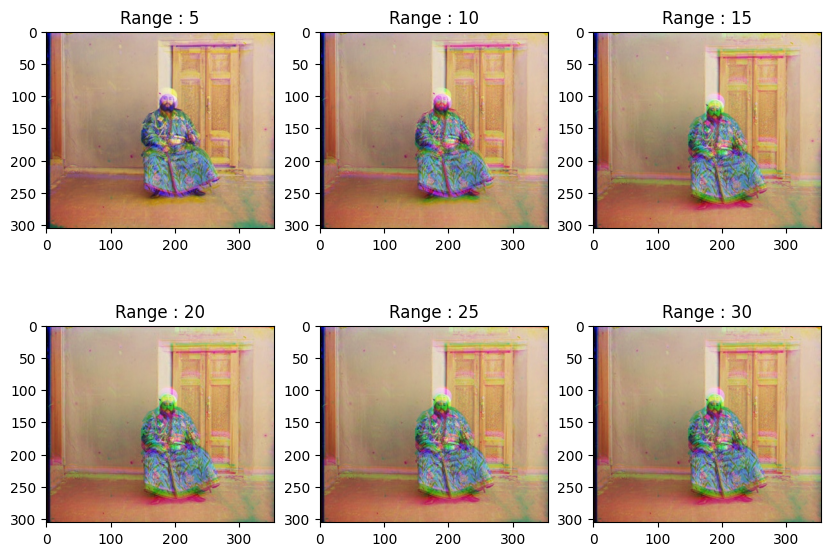

In [37]:
plot_images(4)

* Although the interval value was kept higher than the other pictures, the match was not fully realized. Since the shift between the filters is different, the range of [-30,30] does not produce satisfactory results either. This is an example of a failed example.

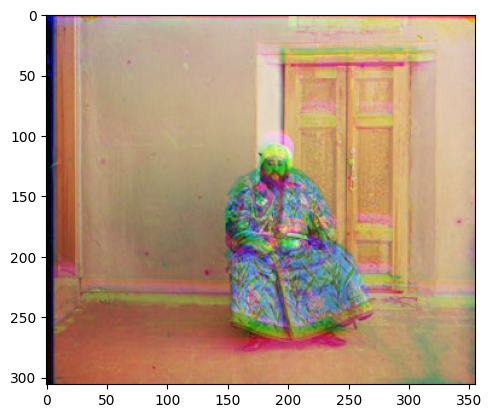

In [38]:
img_4 = cv2.imread("NCC/" + str(30) + "_" + str(3) + ".jpg")
plt.imshow(img_4)

#### Example 5
* The 2nd picture is selected. (Range: 10)

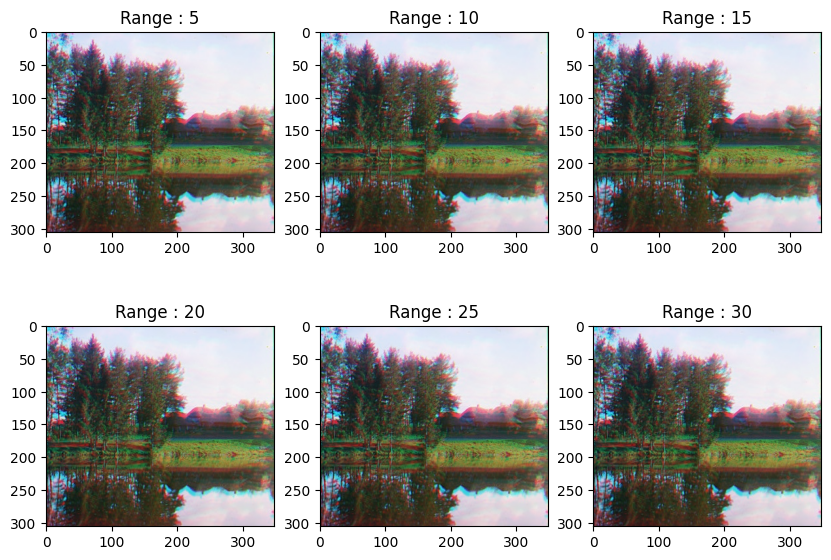

In [39]:
plot_images(5)

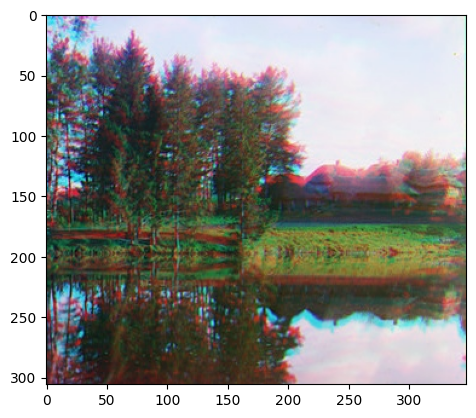

In [40]:
img_5 = cv2.imread("NCC/" + str(10) + "_" + str(4) + ".jpg")
plt.imshow(img_5)

* It is a failed example. Failure is not observed because the sample is dark. Its failure becomes even more visible when we change its contrast.

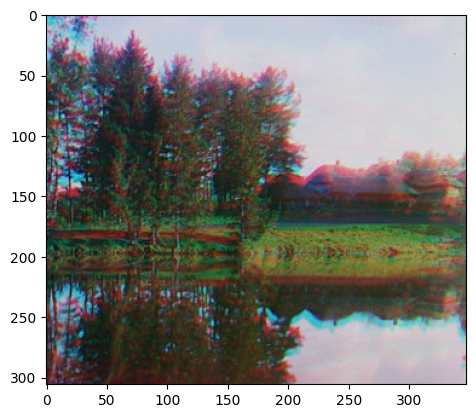

In [41]:
new_img_5 = gamma_correction(img_5,0.5)
plt.imshow(cv2.cvtColor(new_img_5, cv2.COLOR_BGR2RGB))

#### Example 6
* The 2nd picture is selected. (Range: 10)

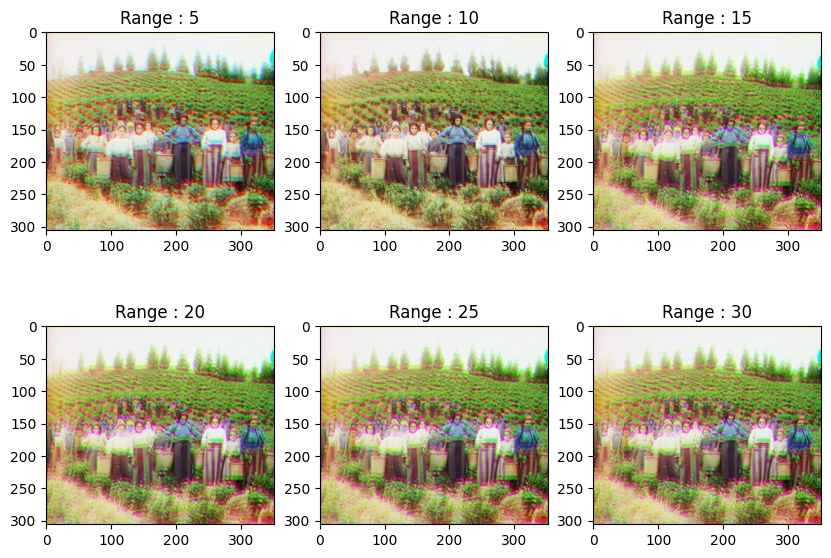

In [42]:
plot_images(6)

* A successful example is observed.

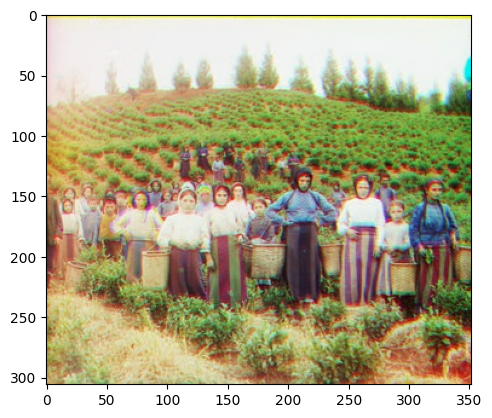

In [43]:
img_6 = cv2.imread("NCC/" + str(10) + "_" + str(5) + ".jpg")
plt.imshow(img_6)

* The quality of the picture degrades with the contrast sensitivity. This is an example that not every process will add quality to the photo.

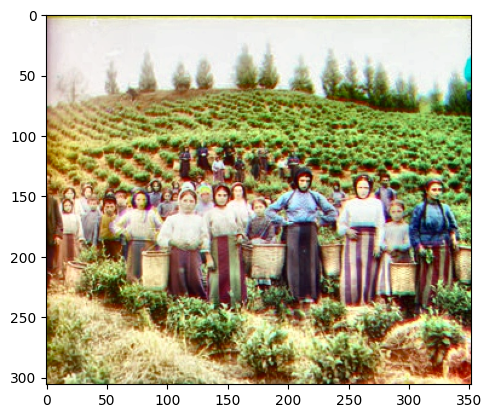

In [44]:
new_img_6 = contrast(img_6)
plt.imshow(new_img_6)

#### Example 7
* The 6th picture is selected. (Range: 30)

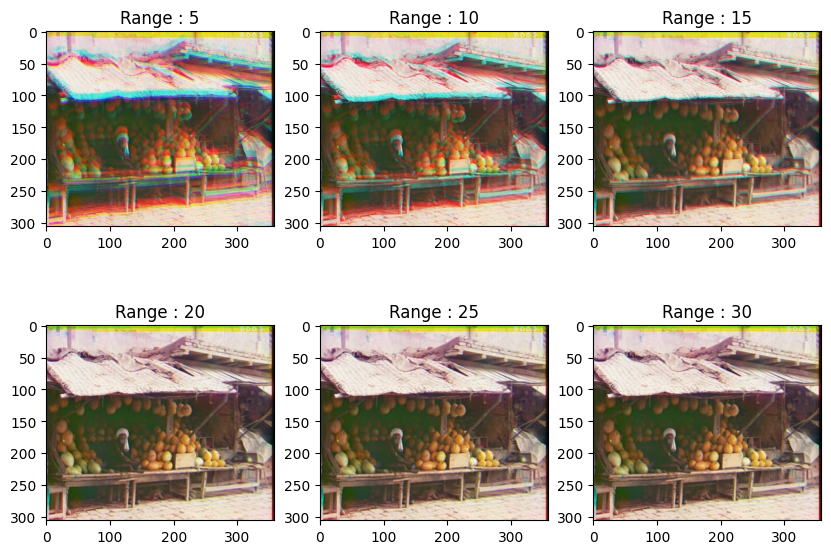

In [45]:
plot_images(7)

* A successful example is observed.

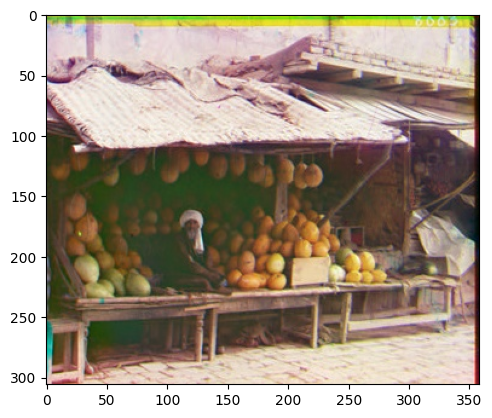

In [46]:
img_7 = cv2.imread("NCC/" + str(30) + "_" + str(6) + ".jpg")
plt.imshow(img_7)

#### 7.1 After Contrast

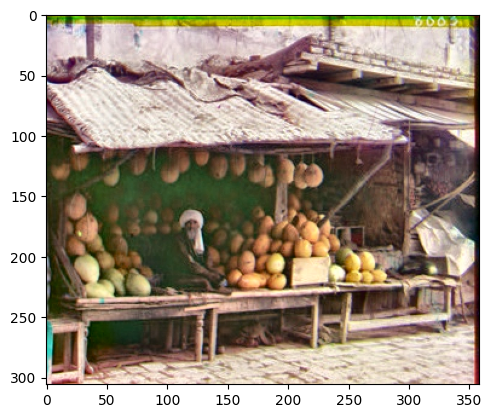

In [47]:
new_img_7 = contrast(img_7)
plt.imshow(new_img_7)

#### 7.2 After Gamma Correction

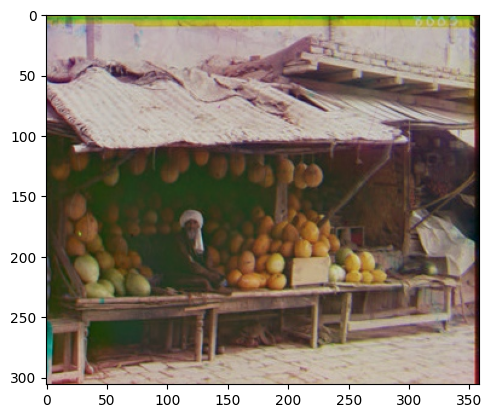

In [48]:
new_img_7 = gamma_correction(img_7,0.5)
plt.imshow(cv2.cvtColor(new_img_7, cv2.COLOR_BGR2RGB))

* Behind the man in the picture is a melon. Compared to the first photo, when you look at this photo, the melons behind the man seem more selectable. It has been a successful quality improvement.

#### Example 8
* The 6th picture is selected. (Range: 30)

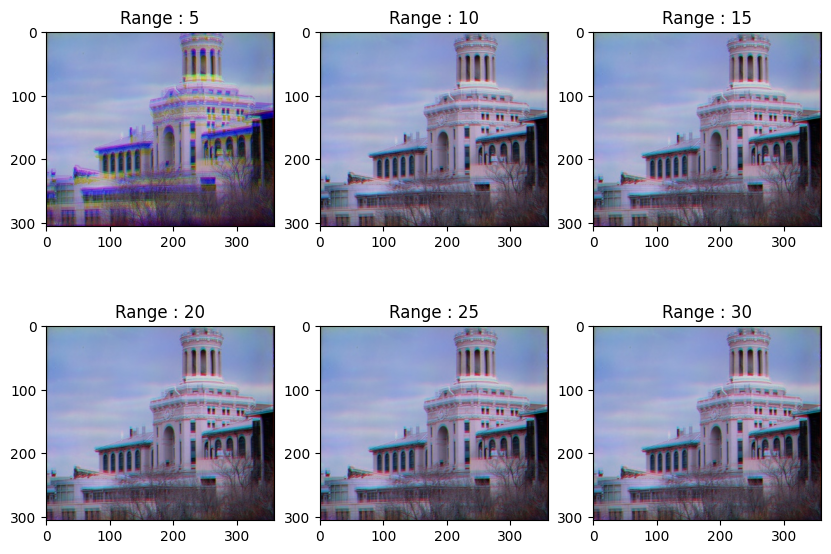

In [49]:
plot_images(8)

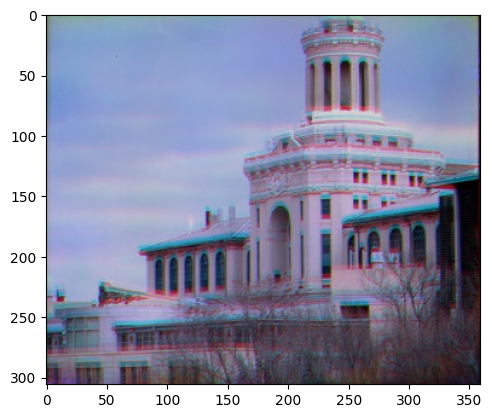

In [50]:
img_8 = cv2.imread("NCC/" + str(30) + "_" + str(7) + ".jpg")
plt.imshow(img_8)

* A successful match has been made. With the contrast change, the photo quality has been increased.

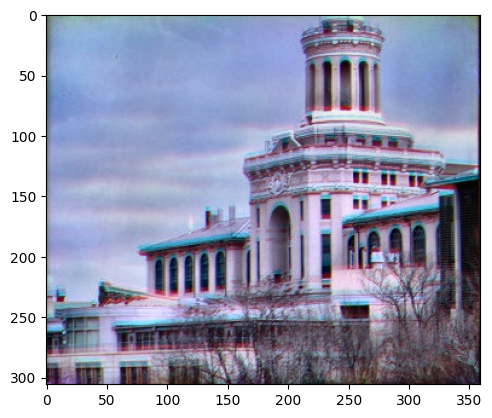

In [51]:
new_img_8 = contrast(img_8)
plt.imshow(new_img_8)

### References

* Template Matching by Correlation | Image Processing I [https://www.youtube.com/watch?v=1_hwFc8PXVE]
* Gamma Correction [https://stackoverflow.com/questions/61695773/how-to-set-the-best-value-for-gamma-correction]
* The Prokudin-Gorskii Photographic Record [https://www.loc.gov/exhibits/empire/gorskii.html]